# Chapter-06. 文本的动态词向量表示
## 【章节目标】
- 了解各种文本表示的方法
- 掌握elmo动态词向量模型的原理
- 掌握gpt模型的原理
- 掌握Bert及其改进模型的原理

## 【章节内容】

### 6.1 词向量技术概述
#### 6.1.1 基础回顾-词向量
**词的表示方法：**

如何通过量化的方式表示一个单词是NLP领域非常核心的问题

- 基于onehot的独热编码向量表示
- 基于分布式的稠密向量表示

##### 1.独热编码：

- 基于One-hot能否表示单词之间语义相似度？

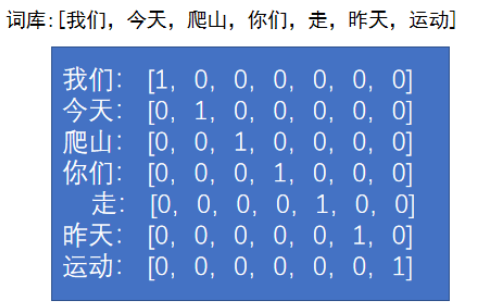

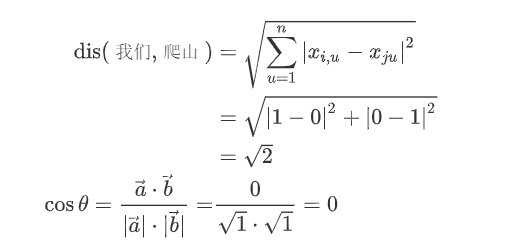  
> 爬山、运动）的欧式距离是$\sqrt{2}$,（运动、昨天）的欧式距离是$\sqrt{2}$。当然每个词之间的余弦相似度也都是相同的。词向量学习到的每个向量都是用不同的浮点数表示，计算每个单词的相似度是不一样的，可以表示单词之间语义相似度。

**One-hot向量的缺点：**

- One-hot向量稀疏性，词向量是稠密向量；
- One-hot向量不能表示单词之间语义相似度；

##### 2.分布式词向量：

- 词向量从2013年提出开始，慢慢的发展成现在的Bert、XLNet等比较前言的技术。
- 如何通过某种方式来代表单词的语义是自然语言处理理解的最为核心的问题

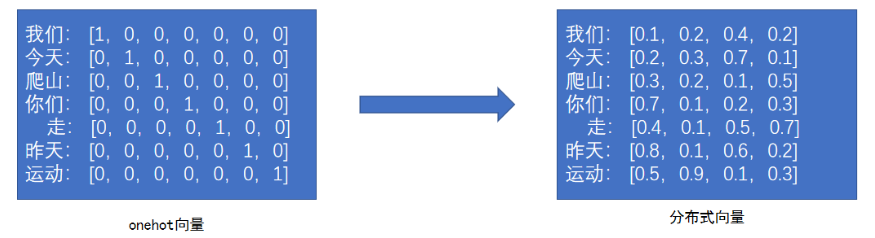

**分布式词向量学习：**

- 把一堆文本输入到某些模型中，我们可以得到词向量。模型包括：CBOW、Skip-Gram、NNLM、Glove、MF、elmo、Gaus Embedding、LDA、Bert等。

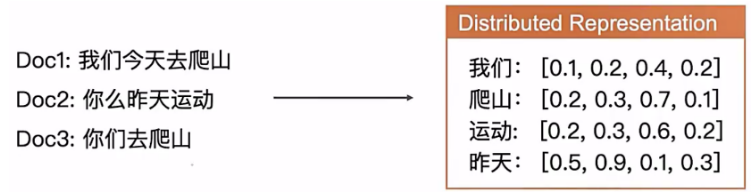

**怎么理解分布式假设？**

- 所谓分布式假设，用一句话可以表达：相同上下文语境的词有近似含义
    - 这个苹果真好吃
    - 这家的面很好吃
- 而由此引申出了 Word2vec、FastText，在此类词向量中，虽然其本质仍然是语言模型，但是它的目标并不是语言模型本身，而是词向量，其所作的一系列优化，都是为了更快更好的得到词向量。GloVe 则是基于全局语料库、并结合上下文语境构建词向量，结合了 LSA 和 Word2vec 的优点。

**分布式词向量的可视化：**

- 把词向量表示成二维数据后，可以发现类似的单词是聚在一起的，因此可以得出词向量可以区分单词之间语义的相似度
- 词向量的可视化常用的算法是sklearn中的T-SNE，它是一种降维算法。降维算法还有PCA、ICA、LDA，针对词向量的降维我们通常使用T-SNE

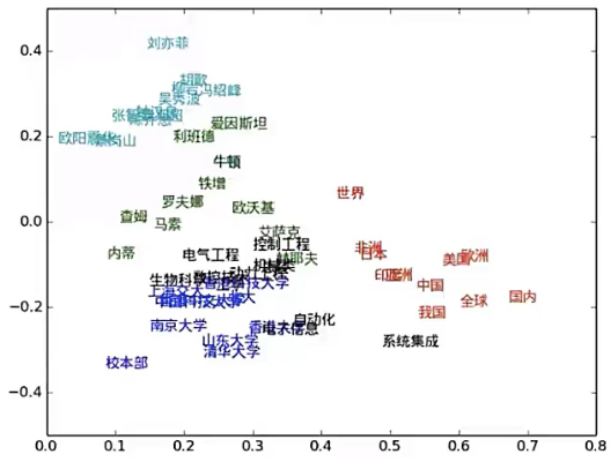

#### 6.1.2 基础回顾-语言模型
**语言模型-概念：**

语言模型用来判断：是否一句话从语法上是通顺的。

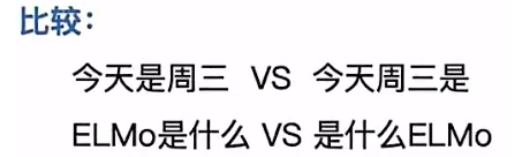  
通顺代表句子出现的概率大，因此需要计算句子出现的概率。

**语言模型-相关必要知识点：**

- Chain Rule（链式法则）, Markov AssumptionUnigram（马尔可夫假设）
- Bigram（二元语言模型）, N-gram（N元语言模型）
- Add-one smoothing, Good-turning smoothing...
- Perplexity（困惑度）

**语言模型-对于句子的计算：**

- 贝叶斯公式: 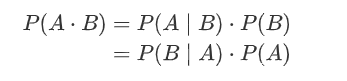

- Chain Rule: 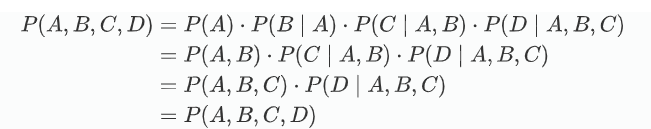

- Chain Rule for Language Model：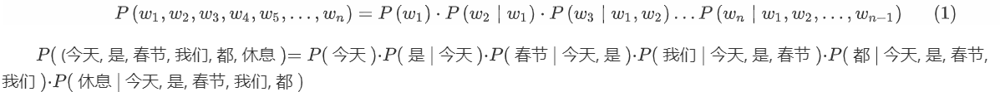

**Markov Assumption 马尔科夫假设：**

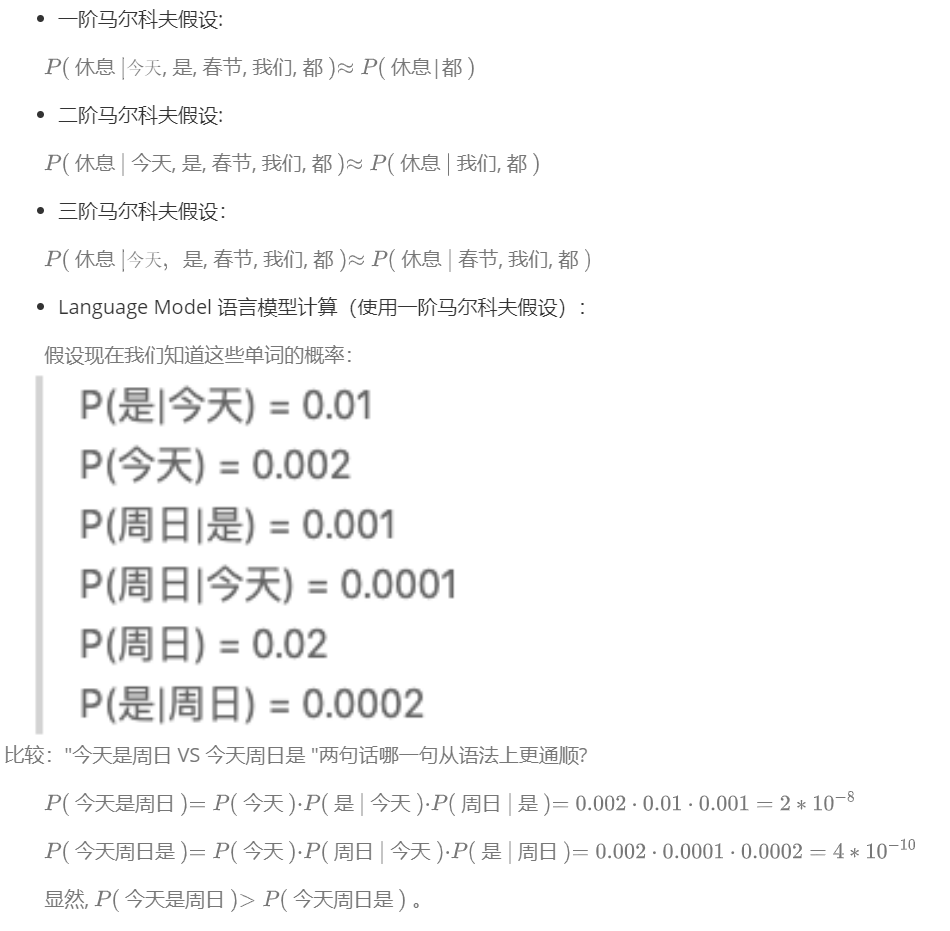

#### 6.1.3 基于分布式表示的模型总览
**文本表示有哪些方法：**

- 基于one-hot、tf-idf、textrank等的bag-of-words，非分布式；
- 主题模型：LSA（SVD）、pLSA、LDA；
- 基于词向量的固定表征：word2vec、fastText、glove
- 基于词向量的动态表征：elmo、gpt、Bert

**文本表示方法分类**

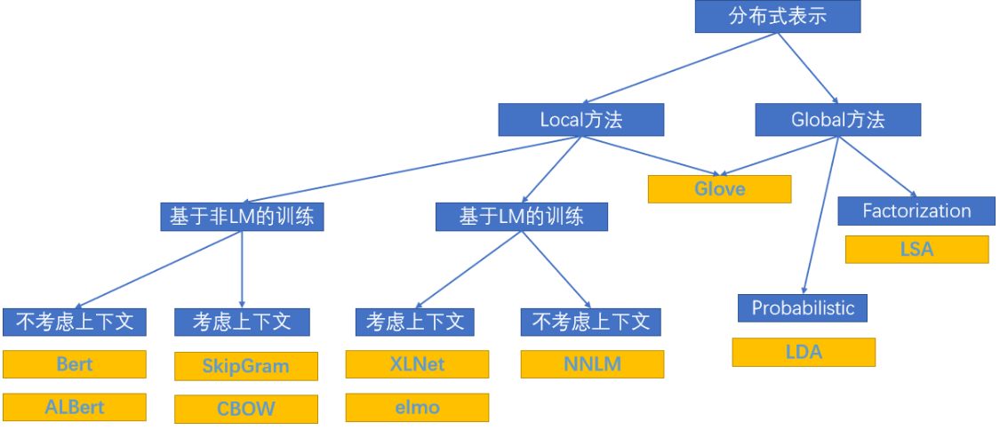

**词向量训练常见的方法：**

- 基于非语言模型的方法
    - SkipGram预测相邻单词的概率，CBOW已知两边单词，预测中间单词
- 基于语言模型的方法
    - Neural Network Language Model基于语言模型和马尔科夫假设进行训练

#### 6.1.4 基于LSTM的词向量学习
**传统的词向量有什么问题？**

- 上述方法得到的词向量是固定表征的，无法解决一词多义等问题，如“川普”。

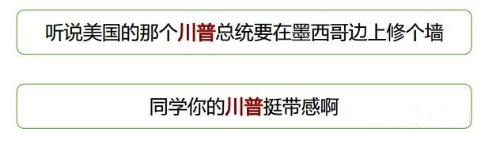  
“川普”在两句话中的意思是完全不同的

**单向LSTM学习词向量：**

- 使用前面的词作为输入，预测后面的词。

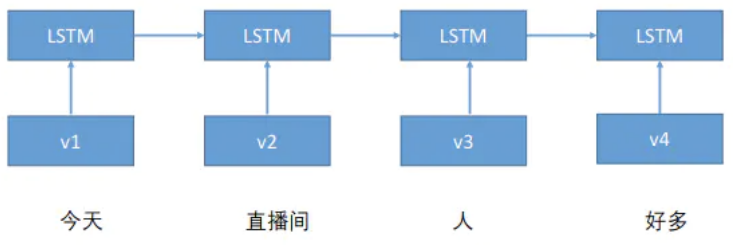
> - “今天”预测“直播间”
> - “今天”“直播间” 预测“人”
> - “今天”“直播间”“人”预测“好多”

**双向LSTM学习词向量：**

- 一个前面预测后面，一个后面预测前面。

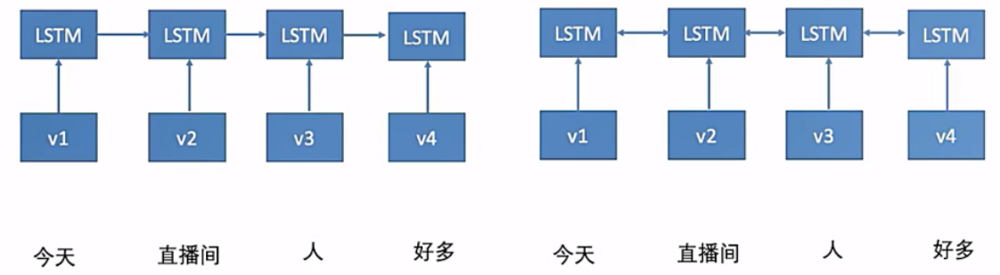  
前向LSTM学习后面词对前面词的依赖特征；后向LSTM学习前面词对后面词的依赖特征

#### 6.1.5 深度学习中的层次表示以及Deep BI-LSTM
- 启发：深度学习中的层次表示（Hierarchical Representation）：
- 越高级的特征表示越来越具体化

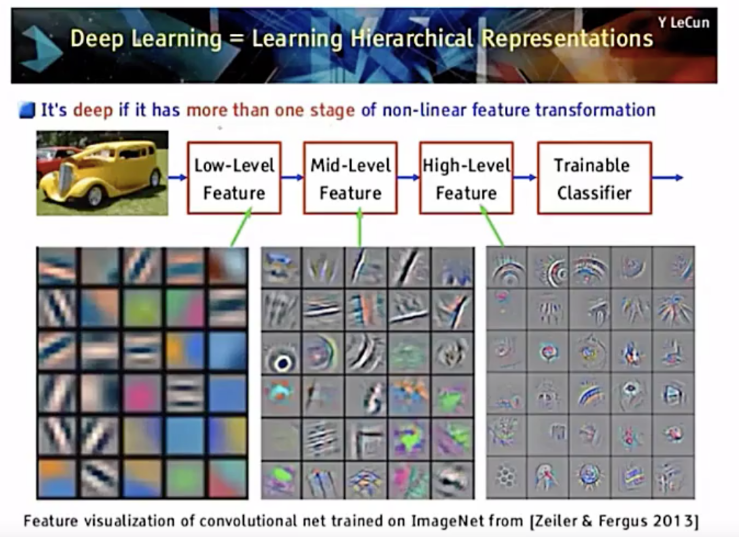  
不同层CNN学习图像的不同级别特征

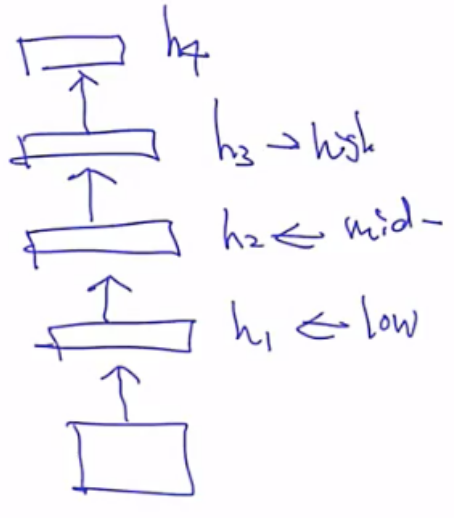  
不同层LSTM学习不同级别的特征

**启发：深度学习中的层次表示（Hierarchical Representation）：**

- 通过图像的例子，可以看出深度学习模型能够学习出每一层级的特征，而且每一层及所捕获的特征信息从简单到复杂，越来越能够体现出图像所表示的内容（Semantic）
- 问题：对于文本，是否也有类似的规律？如果有，那对于文本来讲，从简单到复杂的特征如何理解？
- 单词特征，句法特征，语义特征
- 图像：边缘/颜色—形状/色块—高级形状
- 文本： 单词--- 短语 --- 语义

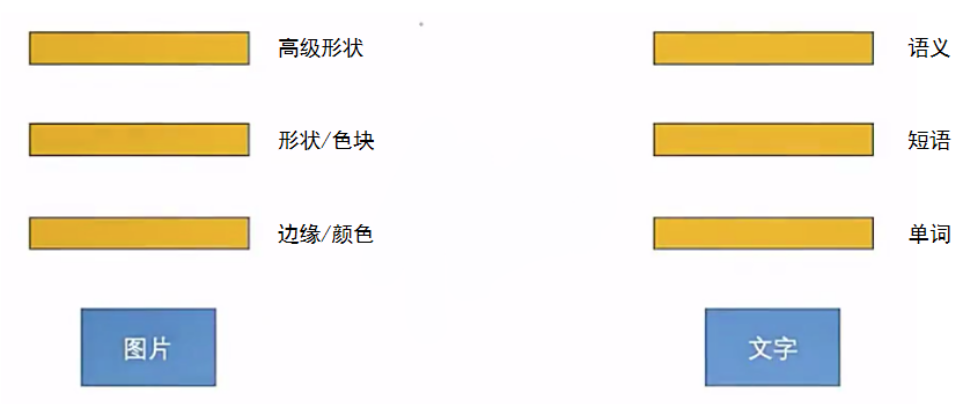

**深度双向LSTM --Deep BI-LSTM**

- 每一层学习不同级别的文本特征

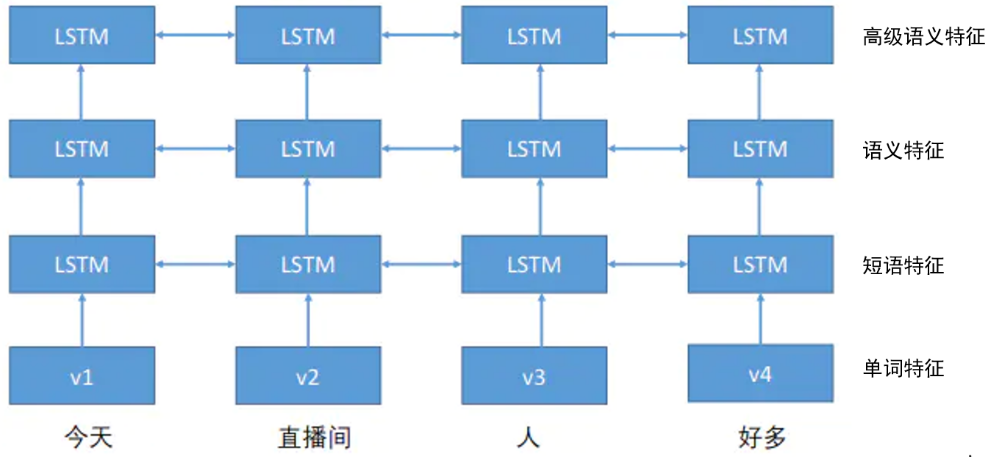

- 获取同一个词在不同语境下的不同语义

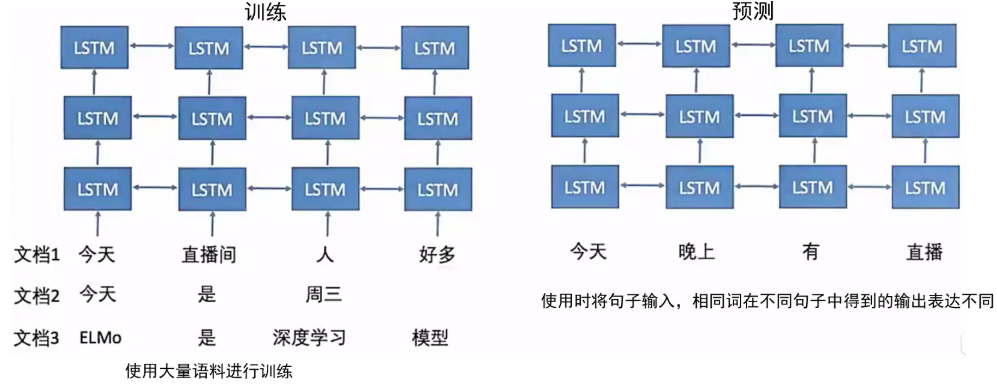

### 6.2 基于双向LSTM的词向量模型-elmo
#### 6.2.1 elmo简介
**词向量要解决的问题**

词向量是自然语言处理任务中非常重要的一个部分，词向量的表征能力很大程度上影响了自然语言处理模型的效果。词向量需要解决两个问题：

- （1）能够反映出语义和语法的复杂特征。
- （2）能够准确的对不同上下文进行反应，比如多义词的问题。

**传统的词向量模型缺点**

- Word2Vec 和 Glove都是静态词向量模型，只能学习单词的固定词向量。
    - "我喜欢吃小米"中的"小米"指一种食物
    - "小米手机挺好用"中的"小米"指手机品牌
- 给定上面两个句子，在 Word2Vec 和 Glove 中去得到"小米"的词向量都是一样的，不能根据上下文给出更准确的词向量。

**ELMO词向量是动态的**

- elmo是一种动态词向量算法，在大型的语料库里训练一个 biLSTM (双向LSTM模型)。
- 下游任务需要获取单词词向量的时候，将整个句子输入 biLSTM，利用 biLSTM 的输出作为单词的词向量，包含了上下文信息。
- 可以理解成，biLSTM 是一个函数，函数的输入是一个句子，输出是句子中每个单词的动态词向量。

#### 6.2.2 elmo模型
**ELMO模型要点**

- 双向语言模型
- biLSTM
- 损失函数
- 词向量表示

**ELMO模型结构**

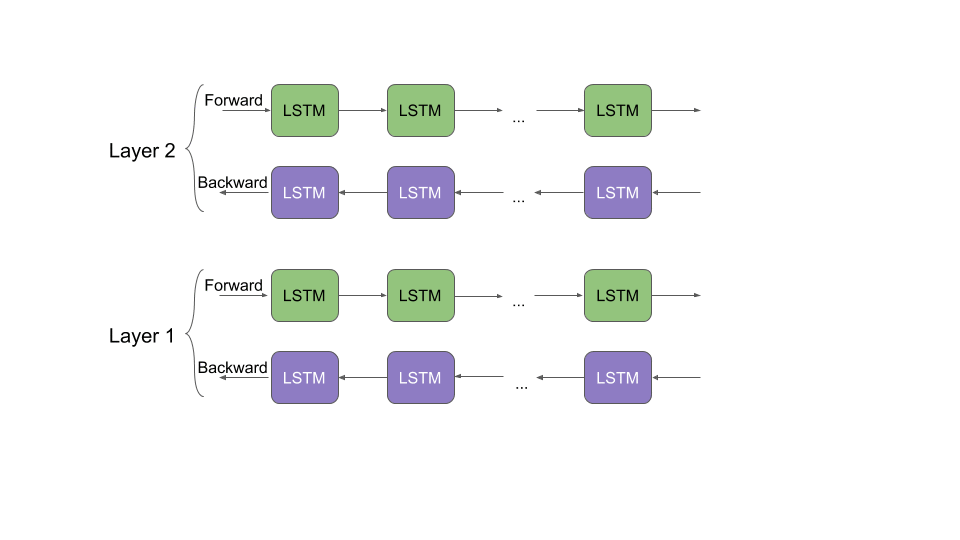  
ELMO模型结构图
- 前向模型 (Forward Model):$$p(t_1, t_2, \dots, t_N) = \prod_{k=1}^N p(t_k \mid t_1, t_2, \dots, t_{k-1})$$
- 后向模型 (Backward Model):$$p(t_1, t_2, \dots, t_N) = \prod_{k=1}^N p(t_k \mid t_{k+1}, t_{k+2}, \dots, t_N)$$

**biLSTM 得到上下文相关的词向量**

- biLSTM 是一种双向的循环神经网络，包含了前向网络与后向网络两部分。下图是一个层数 L = 2 的 biLSTM:

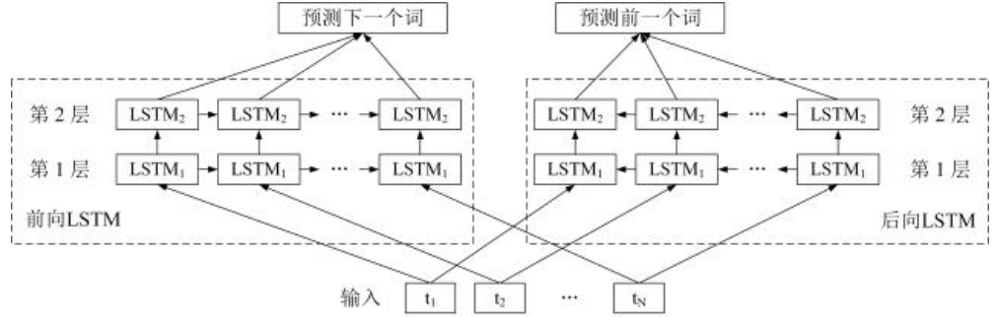

- 每一个单词 $t_i$ 的输入是词向量，这个词向量是固定的，可以使用 Word2Vec 或者 Glove 生成的词向量。注意，elmo 输入时的词向量是固定的，elmo 将输入的词向量传到 biLSTM 得到的才是动态的，包含上下文信息。

**biLSTM 的输出：**

- elmo 的论文中使用以下符号表示双向 LSTM 中每一层对应第i个单词的输出，前向输出包含第i个单词之前的语义，后向输出包含了第i个单词之后的语义
    - $\overrightarrow{h}_{k,j}^{LM}$：第 $k$ 个输入单词在第 $j$ 层前向 LSTM 的输出，包含前文信息。
    - $\overleftarrow{h}_{k,j}^{LM}$：第 $k$ 个输入单词在第 $j$ 层后向 LSTM 的输出，包含后文信息。
- 每一层的输出 $\overrightarrow{h}_{k,j}^{LM}$ 和 $\overleftarrow{h}_{k,j}^{LM}$ 都是单词的动态词向量。

**损失函数**

LSTM 一共 $L$ 层。对于前向 LSTM，每一个单词 $t_{k-1}$ 的最后一层输出 $\overrightarrow{h}_{k-1,L}^{LM}$ 用于预测下一个单词 $t_k$；对于后向 LSTM，每一个单词 $t_{k+1}$ 的最后一层输出 $\overleftarrow{h}_{k+1,L}^{LM}$ 用于预测前一个单词 $t_k$。预测的过程采用 softmax，biLM 需要优化的联合目标函数（最大化对数似然）如下：
$$\sum_{k=1}^N \left( \log p(t_k \mid t_1, \dots, t_{k-1}; \theta_x, \overrightarrow{\theta}_{LSTM}, \theta_S) + \log p(t_k \mid t_{k+1}, \dots, t_N; \theta_x, \overleftarrow{\theta}_{LSTM}, \theta_S) \right)$$
> $\theta_x$：表示单词输入时的词向量参数（通常在 ELMo 中是基于字符 CNN 提取的固定表示）。  
> $\theta_S$：表示 softmax 层的映射参数，用于将隐藏状态映射为词表大小的概率分布，以预测前后的单词。  
> $\overrightarrow{\theta}_{LSTM}$：表示前向 LSTM 的参数，用于计算前向隐藏状态$\overrightarrow{h}_{k-1,L}$。   
> $\overleftarrow{\theta}_{LSTM}$：表示后向 LSTM 的参数，用于计算后向隐藏状态 $\overleftarrow{h}_{k+1,L}$。

**Embedding输出**

在训练好的网络上输入一个新句子，句中每个词都能得到对应的三个Embedding：

- 最低层是词的word embedding；
- 上一层是第一层双向LSTM中对应词位置的Embedding，这层编码词的句法信息更多一些；
- 再上一层是第二层LSTM中对应单词位置的Embedding，这层编码单词的语义信息更多一些。

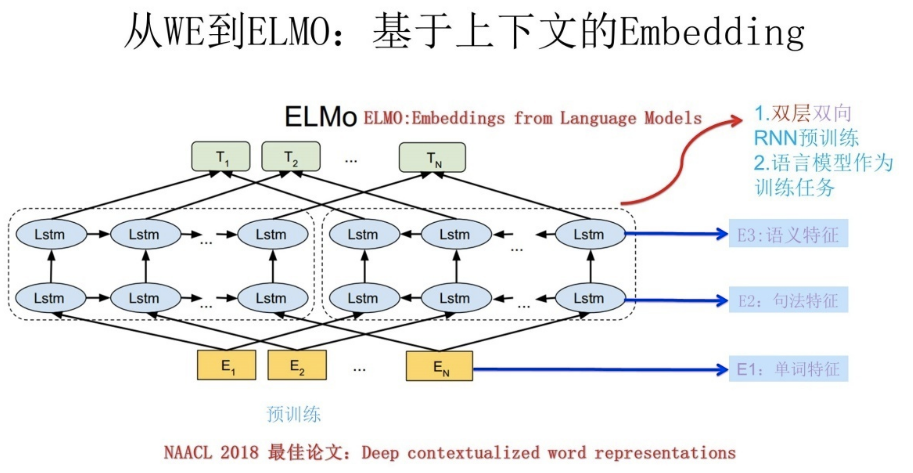  
elmo对于每个token通过一个L层的biLM计算出2L+1个表示:  
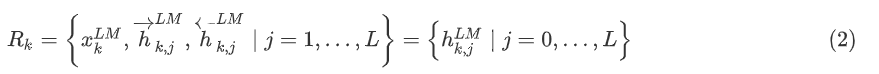  
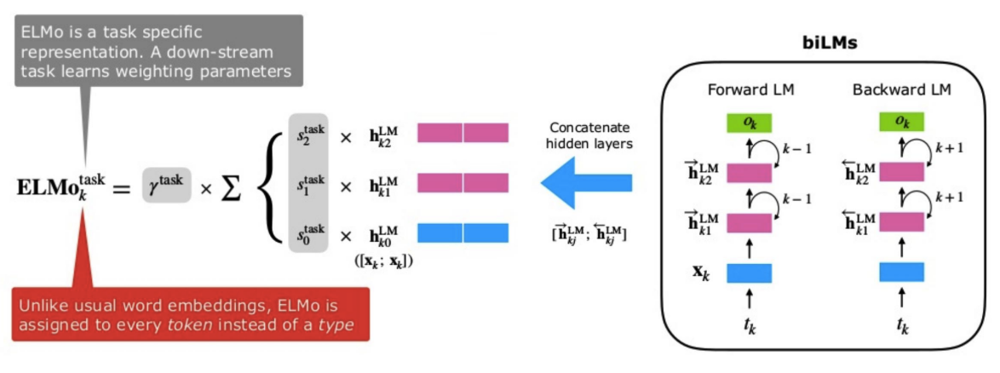

- 其中 $x_k^{LM}$ 是对 token 进行直接编码的结果（字符级 CNN 编码），$\mathbf{h}_{k, 0}^{LM}$ 代表 $x_k^{LM}$，$\mathbf{h}_{k, j}^{LM} = \left[\overrightarrow{h}_{k, j}^{LM} ; \overleftarrow{h}_{k, j}^{LM}\right]$ 是每个 biLSTM 层输出的结果。
- 实际应用中将 ELMo 中所有层的输出 $R$ 压缩成单个向量：$ELMo_k = E(R_k; \Theta_e)$。
    - 最简单的压缩方法是取最上层的结果作为 token 的表示：$$E(R_k) = \mathbf{h}_{k,L}^{LM}$$
    - 更通用的做法是通过一些参数来联合各层的信息：$$ELMo_k^{task} = E(R_k; \Theta^{task}) = \gamma^{task} \sum_{j=0}^L s_j^{task} \mathbf{h}_{k,j}^{LM}$$
> 其中，$s^{task}$ 是 softmax 的结果（即每一层的权重），$\gamma$ 是任务相关的 scale 参数。$\gamma$ 在不同任务中取不同的值效果会有较大差异，在 SQuAD 中设置为 0.01 取得的效果要好于设置为 1 时。

#### 6.2.3 使用elmo词向量
**elmo 采用了典型的两阶段过程：**

- 第一个阶段是利用语言模型进行预训练；
- 第二个阶段是在做下游任务时，从预训练网络中提取对应单词的网络各层的 Word Embedding 作为新特征补充到下游任务中。

下游任务中使用elmo词向量：

- 最简版使用方法

将该词向量加入到一般任务的方法是：先通过特定任务的权重，构成一个该任务专属的向量 $ELMo_k^{task}$，然后将 $ELMo_k^{task}$ 与最初始的词向量（也就是通过字符卷积获得的向量 $x_k$）进行拼接（Concat），表示为：$[x_k; ELMo_k^{task}]$然后将这个拼接后的向量输入到下游任务的 RNN 模型中去。在下游任务的训练过程中，一同训练 ELMo 里的那些特定权重因子（即前文提到的 $\gamma$ 和 $s_j$）。
- 加强版 (Enhanced)
我们可以在下游 RNN 模型的 output 处也加入一个这样的向量，即：$$[h_k; ELMo_k^{task}]$$不同的是，这里（输出端）应该采用与输入端 $ELMo_k^{task}$ 中完全独立/不同的一组权重因子（单独的一组 $s_j$ 参数）。
- 终极版 (Advanced Tuning)
> 可以在 ELMo 模型的接入过程中加入 dropout，以及采用 L2 正则化（L2 loss）的方法来提升模型泛化能力。并且，这里的 L2 正则项系数 $\lambda$ 很有讲究：$\lambda$ 越大：惩罚越大，权重更容易趋于一致，越有取各层平均值的意思。$\lambda$ 越小：惩罚越小，模型越可以灵活地发挥各个层之间的不同带来的效果（相当于让模型自由组合各层）。但是并不是说 $\lambda$ 越小越好，需要根据具体任务调参。

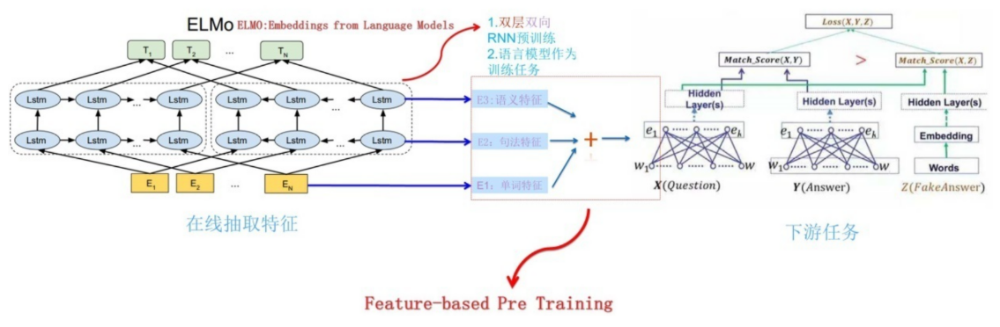

> - 图中展示了下游任务的使用过程，比如我们的下游任务仍然是 QA 问题，此时对于问句 X，我们可以先将句子 X 作为预训练好的 elmo 网络的输入，这样句子 X 中每个单词在 elmo 网络中都能获得对应的三个 Embedding，之后给予这三个 Embedding 中的每一个 Embedding 一个权重a，这个权重可以学习得来，根据各自权重累加求和，将三个 Embedding 整合成一个向量。
> - 然后将整合后的这个 Embedding 作为 X 句在自己任务的那个网络结构中对应单词的输入，以此作为补充的新特征给下游任务使用。对于上图所示下游任务 QA 中的回答句子 Y 来说也是如此处理。

#### 6.2.4 elmo优缺点
**多义词问题解决了吗？**

- 前面我们提到静态 Word Embedding 无法解决多义词的问题，那么 elmo 引入上下文动态调整单词的 embedding 后多义词问题解决了吗？
- 解决了，而且比我们期待的解决得还要好。

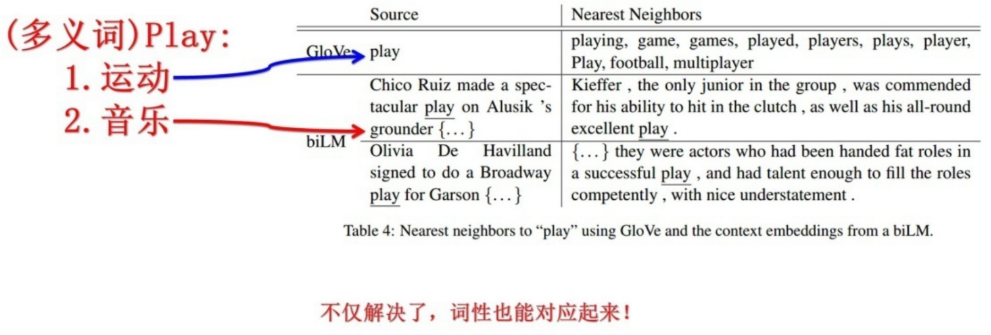

**缺点：elmo有两个缺点：**

- LSTM抽取特征能力远弱于Transformer
- 直接拼接的双向融合并不是真正的双向语言模型，特征融合能力偏弱

### 6.3 基于单向Transformer的词向量模型-gpt
#### 6.3.1 gpt简介
- gpt的核心思想是先通过无标签的文本去训练生成语言模型，再根据具体的NLP任务（如文本蕴涵、QA、文本分类等），来通过有标签的数据对模型进行fine-tuning。
- 具体来说，论文中提出了半监督的方法，即结合了无监督的预训练和有监督的fine-tuning。
- 论文采用两阶段训练。首先，在未标记数据集上训练语言模型来学习神经网络模型的初始参数。随后，使用相应NLP任务中的有标签的数据地将这些参数微调，来适应当前任务。
#### 6.3.2 模型框架
- 输入一个序列，从embedding matrix中获取词向量，加上位置向量作为输入，论文中说明了这里的位置向量不再是之前transformer里的正弦位置向量，而是训练好的位置向量。
- 12层transformer的decoder，其实说它是decoder不是很准确，但说它是encoder也不是很准确，因为它虽然用了decoder的mask self attention 但是它没有decoder的与encoder attention的那部分，论文里写的是decoder，我们就叫decoder吧。
- Transformer里的内容就是self-attention with mask ，残差网络（归一化），前馈全连接层，残差网络（归一化）
- 拿最后一层的transformer的输出经过softmax函数来预测下一个单词

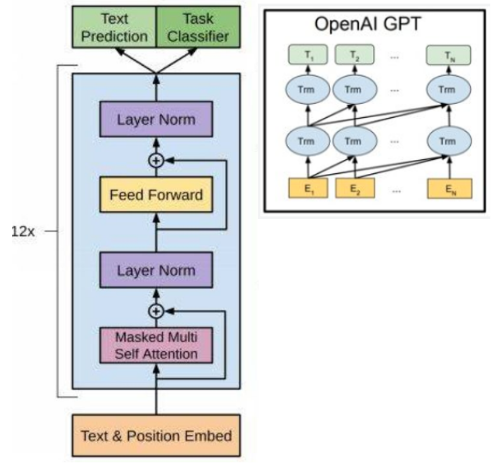

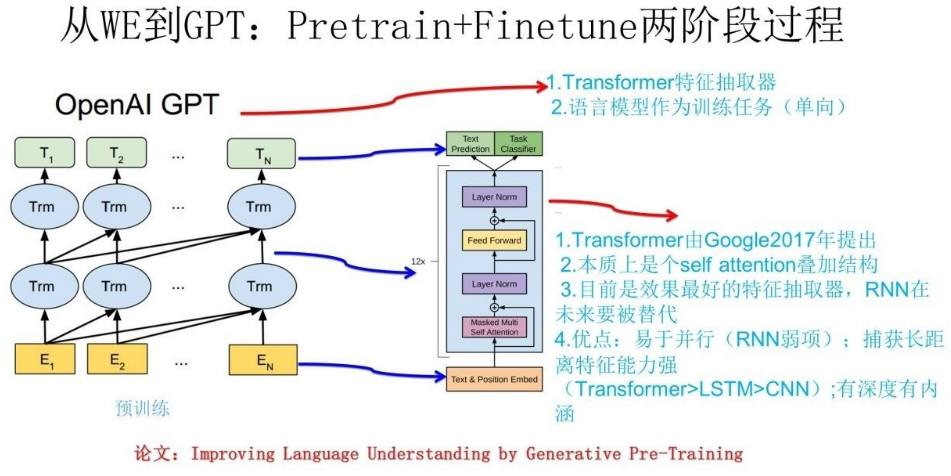

#### 6.3.3 预训练阶段
**1.无监督的Pretraining**

- Transformer模型本身是用来做机器翻译的，它有一个Encoder和一个Decoder。GPT是使用 Transformer 的 Decoder 模块构建的，直接用它来预测下一个词。

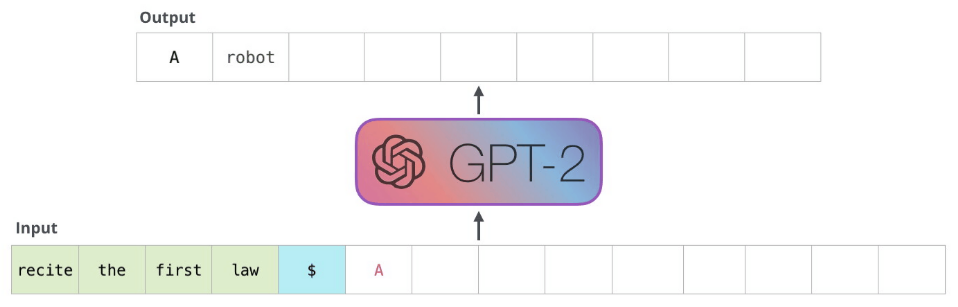
> 在每个新单词产生后，该单词就被添加在之前生成的单词序列后面，这个序列会成为模型下一步的新输入。这种机制叫做自回归（auto-regression）

**masked Self Attention**

- GPT的 Self Attention 层会屏蔽未来的 token，通过改变 Self Attention 的计算，阻止来自被计算位置右边的 token。
- 例如，我们想要计算位置 4，我们可以看到只允许处理以前和现在的 token。

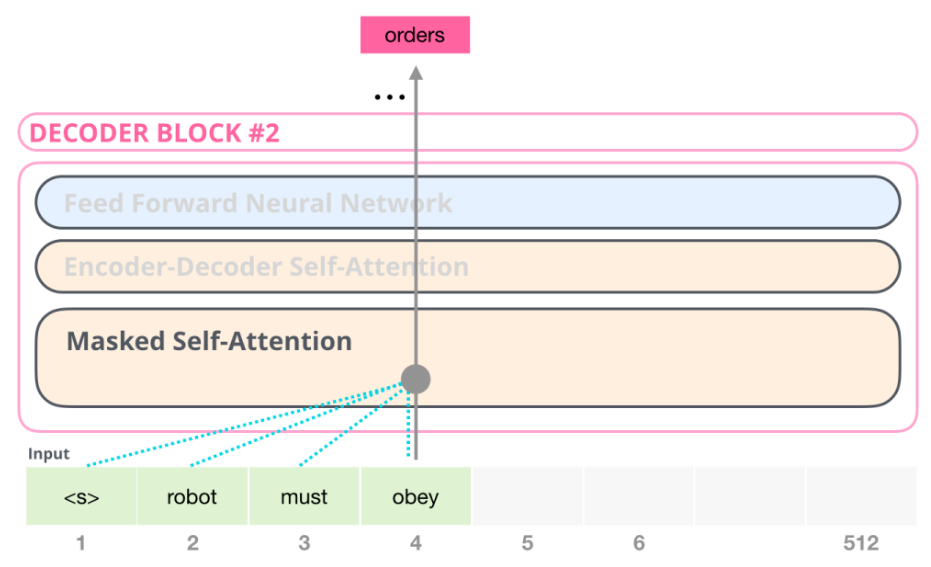
> obey后面的词不会参与本次预测计算  

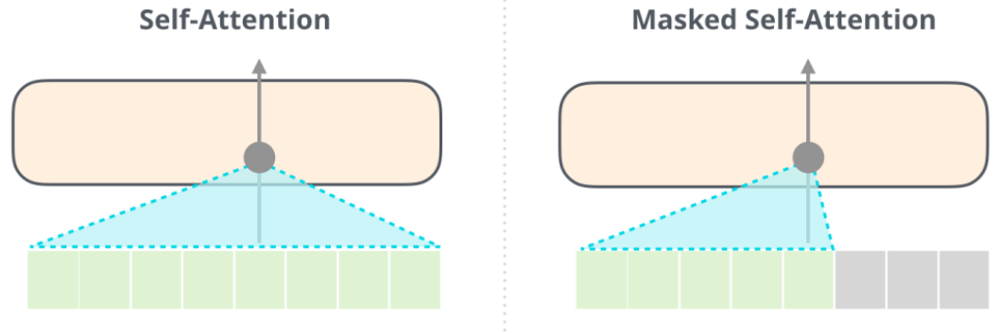
> 一个正常的 Self Attention 模块允许一个位置关注到它右边的部分。而 masked Self Attention 阻止了这种情况的发生

#### 6.3.4 微调阶段
**监督的 Fine-Tuning**
- 与 ELMo 不同，GPT 的微调还是基于自身的框架：ELMo 是在后面接其他任务的模型，而 GPT 是所有任务都用自身框架做，只是不同任务的数据输入处理方法不同而已。
- 无监督的 Pretraining 之后，我们还需要针对特定任务进行 Fine-Tuning。我们先假设监督数据集合 $\mathcal{C}$ 的输入 $x$ 是一个词序列 $x_1, \dots, x_m$，输出是一个分类的标签 $y$。我们把 $x_1, \dots, x_m$ 输入 Transformer 模型，得到最上层最后一个时刻的输出 $h_m^l$，然后我们再加一个 softmax 层（参数为 $W_y$）进行分类，最后用交叉熵损失函数计算损失，从而根据标准数据调整 Transformer 的参数以及 softmax 的参数 $W_y$。这等价于最大似然估计：$$L_2(\mathcal{C}) = \sum_{(x,y)} \log P(y \mid x_1, \dots, x_m)$$

**损失计算**
- 另外在微调时，损失函数要考虑两个方面：一个是语言模型的损失函数，另一个是具体任务的损失函数（例如文本分类）。
- 正常情况下，我们应该调整参数使得 $L_2$ 最大化。但是为了提高训练速度和模型的泛化能力，我们使用了多任务学习（Multi-task Learning）的思想，同时让它最大化似然 $L_1$ 和 $L_2$：$$L_3(\mathcal{C}) = L_2(\mathcal{C}) + \lambda \times L_1(\mathcal{C})$$
> 注意： 这里使用的 $L_1$ 还是之前的语言模型的损失（似然），但是使用的数据不再是前面无监督阶段的庞大语料库（通常记为 $\mathcal{U}$），而是使用当前特定任务的监督数据集 $\mathcal{C}$。并且在计算 $L_1$ 时，只使用其中的输入序列 $x$，而不需要用到标签 $y$。

**微调阶段二（其他任务）**

- gpt在处理下游任务时不用添加其他模型而是用自身，那么在用自身的时候，对于不同任务的处理就会不同，下图为具体处理方案

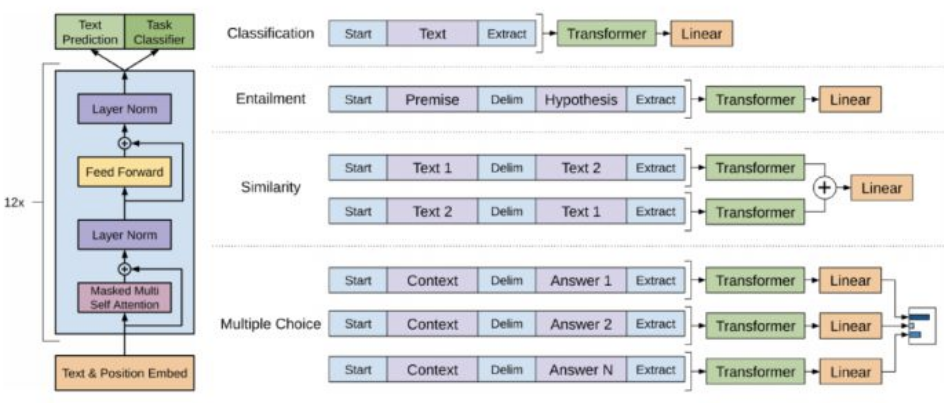

#### 6.3.5 gpt与elmo
**gpt 的模型架构，其实和 elmo 是类似的，主要不同在于三点：**

- 特征抽取器不是用的 RNN，而是用的 Transformer，上面提到过它的特征抽取能力要强于 RNN，这个选择很明显是很明智的；
- elmo使用上下文（双向语言模型）对单词进行预测，而 gpt 则只采用 Context-before 这个单词的上文来进行预测（单向语言模型），而抛开了下文
- 与elmo当成特征的做法不同，OpenAI gpt不需要再重新对任务构建新的模型结构，而是直接在transformer这个语言模型上的最后一层接上softmax作为任务输出层，然后再对这整个模型进行微调。

**为什么Transformer要比LSTM捕获特征更优秀：**

- 1.首先LSTM作为一个序列模型很难捕捉长距离依赖的关系，例如一个句子中主语在前面，如果句子很长的话，句子后半段的处理将会丢失掉主语的信息，所以会出现一些错误的判断和语义理解等等。LSTM也容易出现梯度消失和梯度爆炸等问题。梯度更新的过程就是捕获单词之间的关系过程（任何神经网络结构的本质都是特征提取，更新梯度的过程就是学习的过程，我们建模的目标就是通过模型学习特征到标签的映射关系），所以梯度计算不准确就很难很好捕获单词关系。
- 2.LSTM作为一个序列模型，有一个天然的缺点是不可以并行处理。
    - 对于缺陷1，Transformer使用了self-attention，在自注意力中，一个句子任意两个单词之间的关系都是平等的关系，不会出现无法捕捉长距离依赖的关系。
    - 对于缺陷2，Transformer虽然也是基于序列设计的，但是可以并行的。

### 6.4 基于双向Transformer的词向量模型-Bert
#### 6.4.1 elmo和gpt存在的问题
**elmo和gpt最大的问题：**

- 两者都是单一方向的，无法考虑另一方向的信息。
- elmo用了双向LSTM，但是这是个伪双向，因为它只是把两个方向的信息拼接起来，并非同时获取前后信息，从目标函数里也可以体现这一点，他的目标函数是两个方向的语言模型拼接起来的。
- gpt虽说用的是transformer中的decoder，有mask，前面看不到后面，等于也是单向的

#### 6.4.2 Bert简介
**在2018年，什么震惊了NLP学术界？**

- 毫无疑问是Jacob Devlin等人[2]提出的预训练模型Bert（Bidirectional Encoder Representations from Transformers）。
- Bert被设计为通过在所有层的双向上下文上共同进行条件化来预训练未标记文本的深层双向表示。我们可以在仅一个附加输出层的情况下对经过预训练的Bert模型进行微调，以创建适用于各种任务（例如问题解答和语言推断）的最新模型，进而减少了对NLP任务精心设计特定体系结构的需求。
- Bert是第一个基于微调的表示模型，可在一系列句子级和字符级任务上实现最先进的性能，优于许多特定于任务的体系结构。
- 通俗易懂来讲就是我们只需要把Bert当成一个深层次的Word2Vec预训练模型，对于一些特定的任务，我们只需要在Bert之后下接一些网络结构就可以出色地完成这些任务。

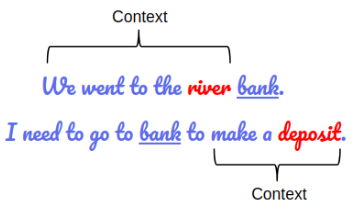

#### 6.4.3 网络架构
**Bert模型架构**

- Bert采用的主要模型是双向Transformer的Encoder。
- 模型的主要创新点都在pre-train方法上，即用了Masked LM和Next Sentence Prediction两种方法分别捕捉词语和句子级别的representation
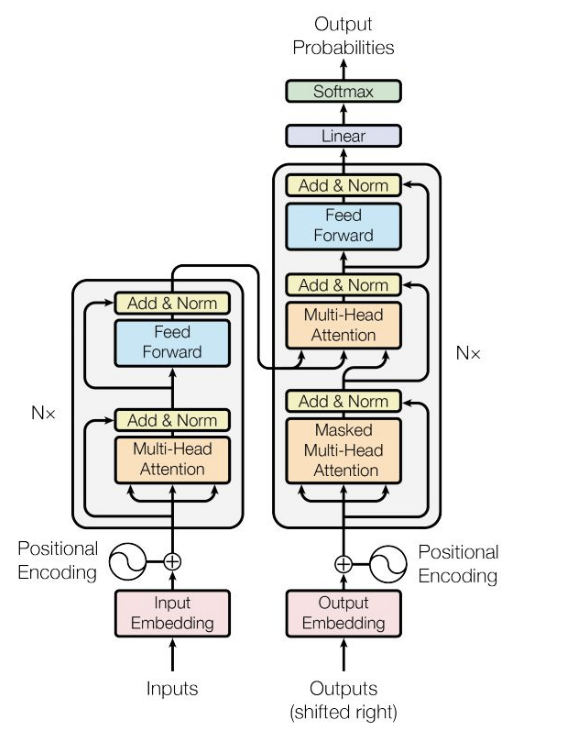  
Transformers（左边为Encoder，右边为Decoder）

- BERT 提供了简单（Base）和复杂（Large）两个模型，对应的超参数分别如下：
    - $\text{BERT}_{\text{BASE}}$：$L=12$，$H=768$，$A=12$，参数总量 110M；
    - $\text{BERT}_{\text{LARGE}}$：$L=24$，$H=1024$，$A=16$，参数总量 340M。
    > 在上面的超参数中，L表示网络的层数（即Transformer blocks的数量），A表示Multi-Head Attention中self-Attention的数量，filter的尺寸是4H。

**Bert、GPT、ELMO对比**

- Bert对比GPT和ELMO两个算法的优点是只有Bert表征会基于所有层中的左右两侧语境。Bert能做到这一点得益于Transformer中Attention机制将任意位置的两个单词的距离转换成了1。

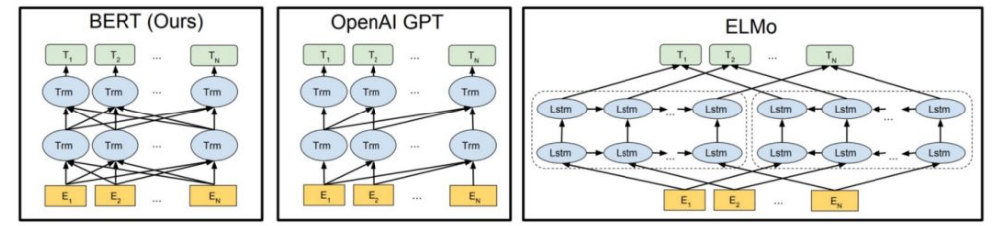  
Bert、GPT、ELMO模型架构

#### 6.4.4 输入表示
**Bert的输入的编码向量（长度是512）是3个嵌入特征的单位和，这三个词嵌入特征是：**

- WordPiece 嵌入：WordPiece是指将单词划分成一组有限的公共子词单元，能在单词的有效性和字符的灵活性之间取得一个折中的平衡。例如图中的示例中‘playing’被拆分成了‘play’和‘ing’；
- 位置嵌入（Position Embedding）：位置嵌入是指将单词的位置信息编码成特征向量，位置嵌入是向模型中引入单词位置关系的至关重要的一环。位置嵌入的具体内容参考我之前的分析；
- 分割嵌入（Segment Embedding）：用于区分两个句子，例如B是否是A的下文（对话场景，问答场景等）。对于句子对，第一个句子的特征值是0，第二个句子的特征值是1。

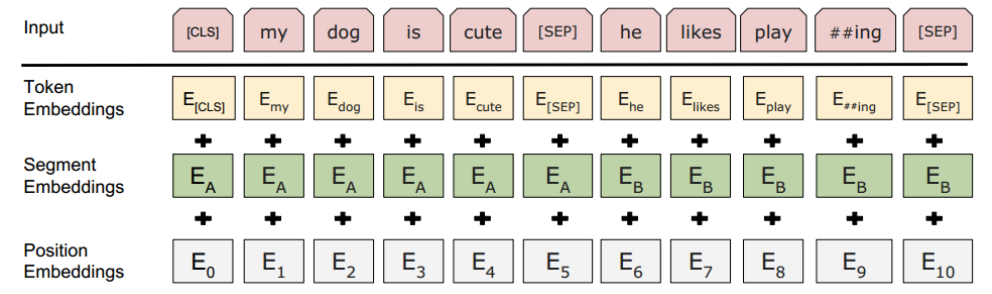
> 两个特殊符号[CLS]和[SEP]，其中[CLS]表示该特征用于分类模型，对非分类模型，该符合可以省去。[SEP]表示分句符号，用于断开输入语料中的两个句子。

#### 6.4.5 Bert预训练
**Bert是一个多任务模型，它的任务是由两个自监督任务组成，即MLM和NSP：**

- Masked Language Model：遮掩语言模型
- Next Sentence Prediction：预测下一个句子（关系）  

**Masked Language Model（遮掩语言模型）理解：**
- 语言建模包括预测单词的上下文，作为一种学习表示的方法。传统上，这包括到当给出前面的单词时预测句子中的下一个单词。

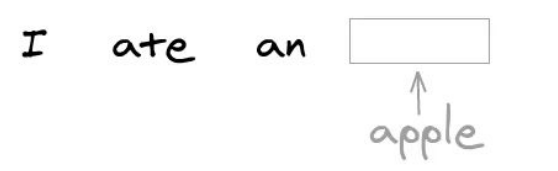

- 相反，Bert使用了一个掩码语言模型目标，在这个模型中，我们在文档中随机地对单词进行掩码，并试图根据周围的上下文来预测它们。

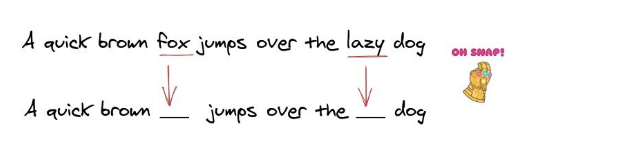

**Masked Language Model（遮掩语言模型）细节：**

- 在预训练的时候，随机mask掉15%的单词，让语言模型去预测这个单词，如图（图中512是padding，规定了句子的长度）
- 该任务非常像我们在中学时期经常做的完形填空。正如传统的语言模型算法和RNN匹配那样，MLM的这个性质和Transformer的结构是非常匹配的。

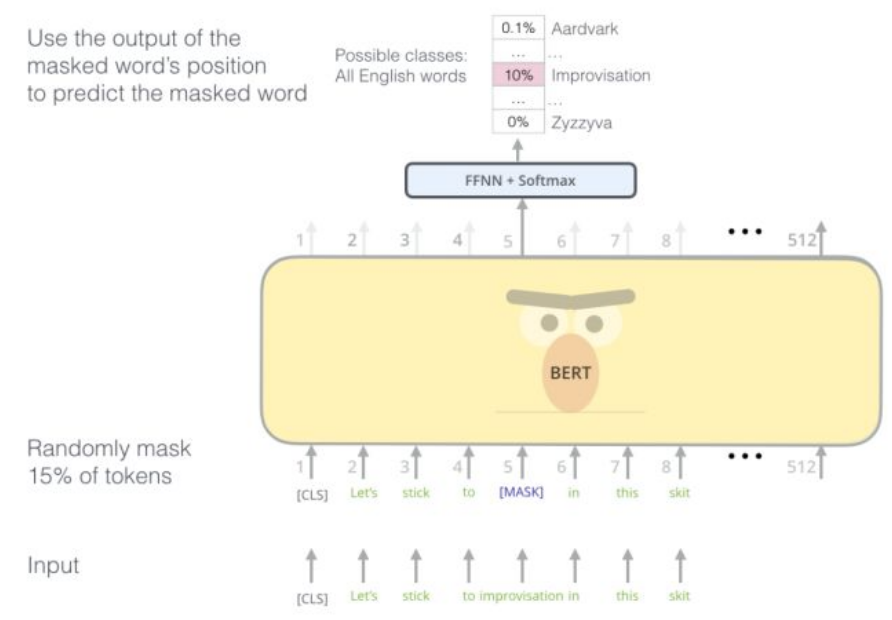

> 这样的话有两个缺点：
> - 大量mask标记，造成预训练和finetune时候的差距，因为finetune没有mask，finetune的时候用的是自己的数据集
> - 收敛很慢，但是效果好（比单向语言模型慢）

**Masked Language Model（遮掩语言模型）问题解决：**

- 在Bert的实验中，15%的WordPiece Token会被随机Mask掉。在训练模型时，一个句子会被多次喂到模型中用于参数学习，但是并没有在每次都mask掉这些单词，而是在确定要Mask掉的单词之后，80%的时候会直接替换为[Mask]，10%的时候将其替换为其它任意单词，10%的时候会保留原始Token。
> - 80%:my dog is hairy -> my dog is [mask]
> - 10%:my dog is hairy -> my dog is apple 
> - 10%:my dog is hairy -> my dog is hairy

**Next Sentence Prediction（预测下一个句子）细节：**

“下一个句子预测”的目的是检测两个句子是否连贯。

- 正样本：训练数据中的连续句被用作一个正样本。
- 负样本，取一个句子，然后在另一个文档中随机抽取一个句子放在它的旁边。

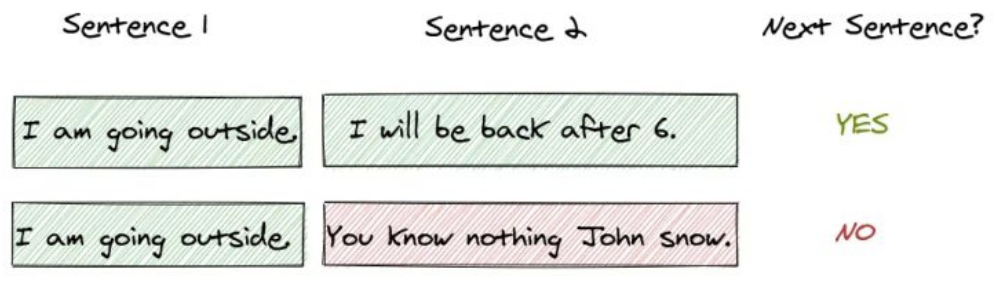  
在这个任务中，Bert模型被训练来识别两个句子是否可以同时出现。

- 对于像QA、NLI等需要理解多个句子之间关系的下游任务，只靠语言模型是不够的。还需要提前学习到句子之间的关系。是一个二分类任务。

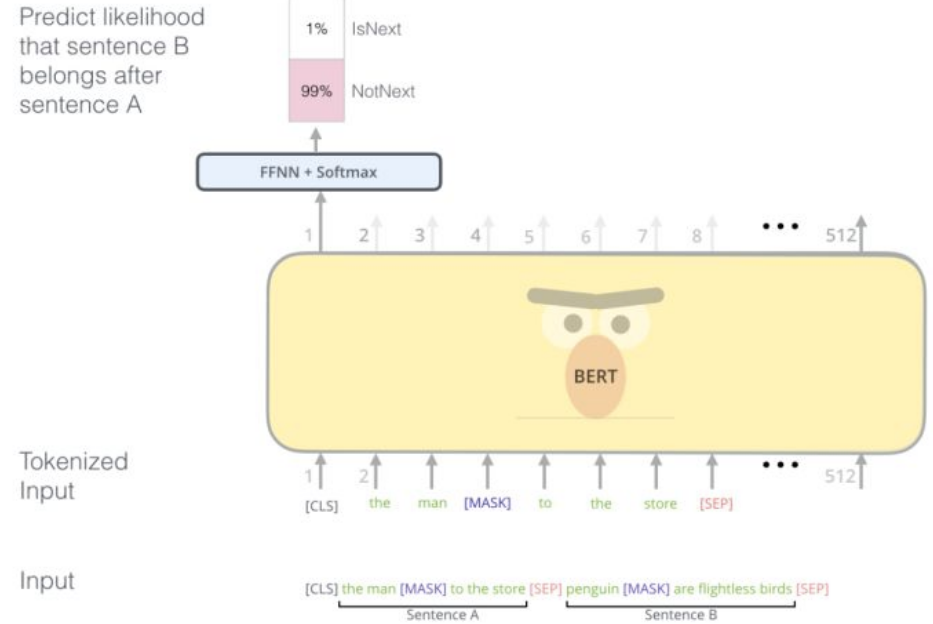
> - 文本前插入一个[CLS]符号，并将该符号对应的输出向量作为整个文本的语义表示，用于最终的分类
> - 输入是A和B两个句子，标记是IsNext或NotNext，用来判断B是否是A后面的句子。这样，就能从大规模预料中学习到一些句间关系。

**Bert模型权重：**

- 最后经过大量语料的无监督学习训练，我们得到了Bert预训练模型，Bert自带字典vocab.txt的每一个字或者单词都被768维度的embedding（即权重）所表示。当我们需要完成特定任务时，若对它们的embedding进行微调（即fine-tune），还能更好得适应任务。

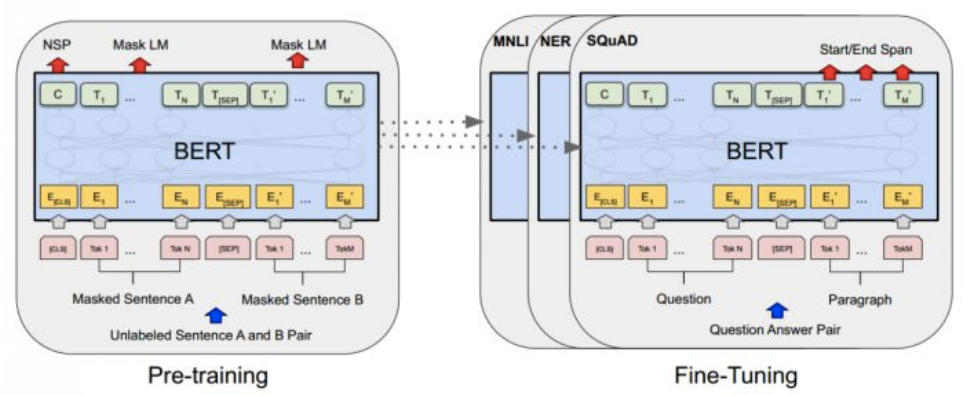  
针对不同种类的任务进行微调

#### 6.4.6 微调
**Bert和gpt一样，也分两个阶段：**

- 第一阶段：预训练过程，
- 第二阶段：适应具体业务场景，进行结构改造。改造示意图如下图：

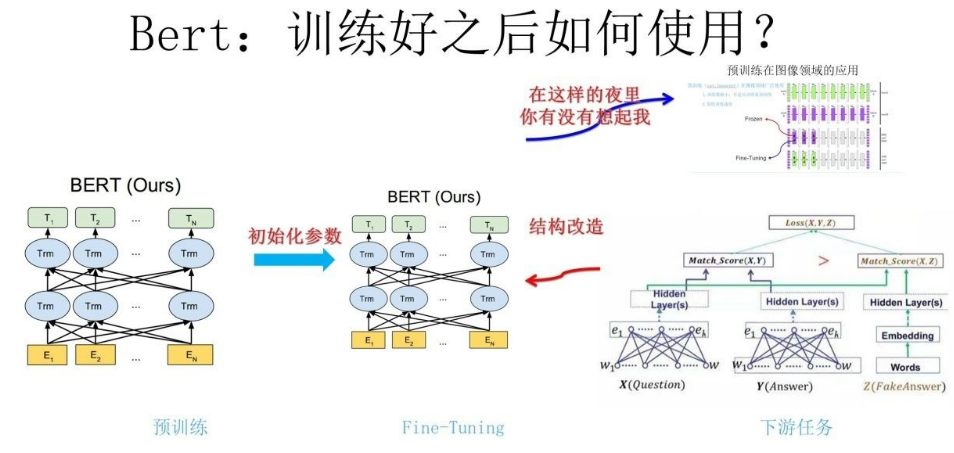

**迁移策略--文本分类任务和文本匹配任务：**

- 只需要用得到的表示（即encoder在[CLS]词位的顶层输出）加上一层MLP就好了

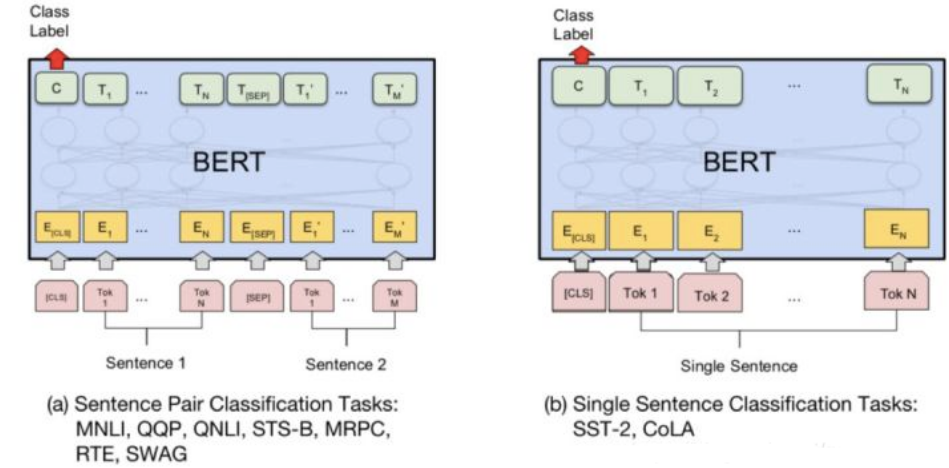

**迁移策略—序列标注任务**

- 在每个时间片输出一个概率，并通过softmax得到这个Token的实体类别或者使用Bert+CRF

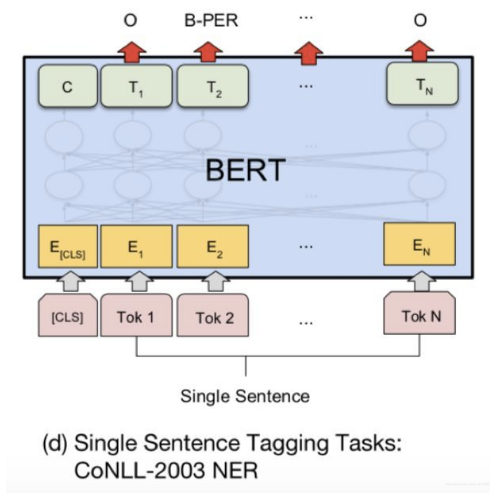

**迁移策略—问答任务**

- SQuAD的输入是问题和描述文本的句子对。输出是特征向量，通过在描述文本上接一层激活函数为softmax的全连接来获得输出文本的条件概率，全连接的输出节点个数是语料中Token的个数。

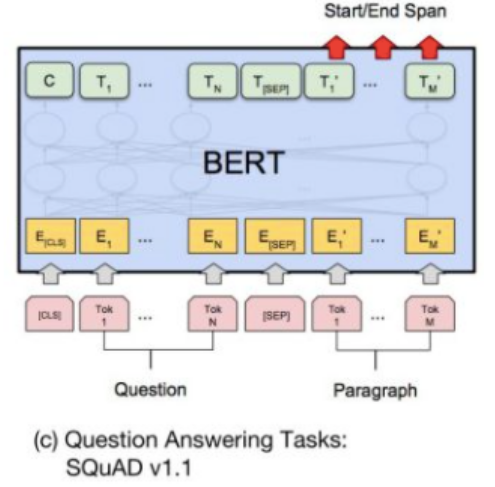


#### 6.4.7 elmo、gpt和Bert的关系
**Bert其实和elmo及gpt存在千丝万缕的关系：**
- 如果我们把gpt预训练阶段换成双向语言模型，那么就得到了Bert；
- 而如果我们把elmo的特征抽取器换成Transformer，那么我们也会得到Bert。
- Bert最关键两点，一点是特征抽取器采用Transformer；第二点是预训练的时候采用双向语言模型，当然还借鉴了word2vec的负采样思想。

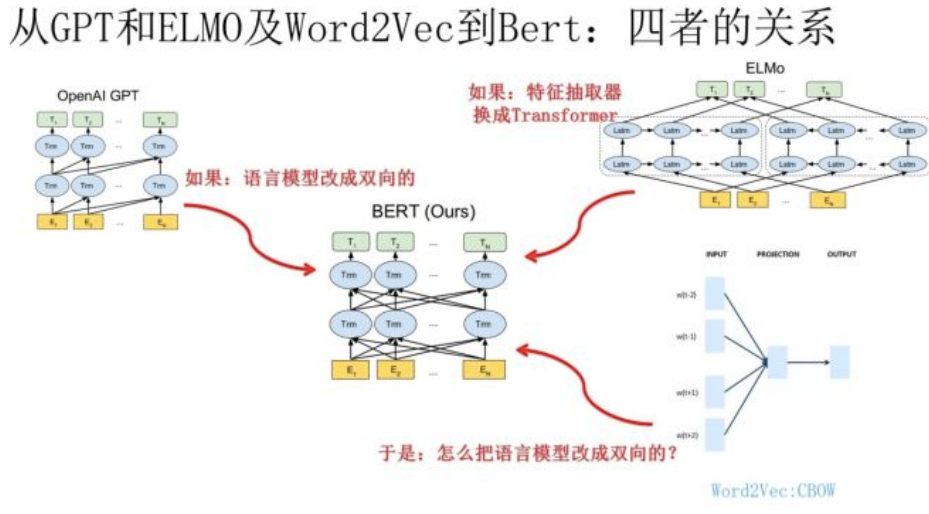

### 6.5 其他预训练模型和迁移学习
#### 6.5.1 改进的预训练模型
**一些基于Bert和gpt改进的模型：**

- gpt2
- 百度ERNIE
- XLNet
- ALBert

#### 6.5.2 gpt2

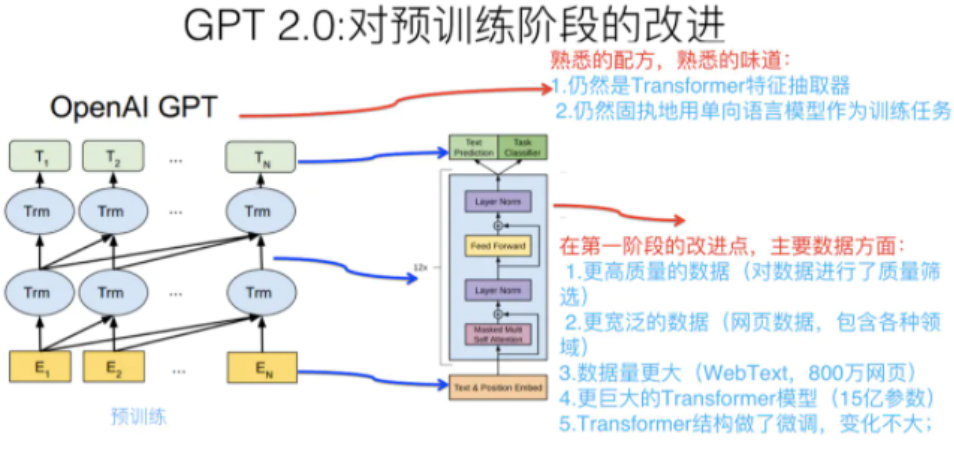

**问题1 ：gpt2把第二阶段的Finetuning做有监督地下游NLP任务，换成了无监督地做下游任务。为什么这样做？**

- 一种看法认为，只是gpt作者想说明在第一阶段Transformer学到了很多通用的包含各个领域的知识。

**问题2：为什么gpt 2.0仍然固执地用单向语言模型，而不是双向语言模型呢？**

Bert的论文认为，Bert的有效性主要是因为使用了双向语言模型。

- 1.生成内容后续单词这种模式，单向语言模型更方便；
- 2.想证明通过增加数据量和模型结构，单向模型未必输双向模型。

**问题3：gpt2训练好的语言模型，如何无监督适应下游任务，比如文本摘要，怎么知道是在做文本摘要任务呢？**

- 首先，所有任务都采取相同的往出蹦字的输出模式。gpt2.0给出了一种新颖的生成式任务的做法，就是一个字一个字往出蹦，然后拼接出输出内容作为翻译结果或者摘要结果。gpt-2的输入也会加入提示词，比如输入格式是文本+<summarize>:，gpt-2模型就会知道是做摘要工作了。

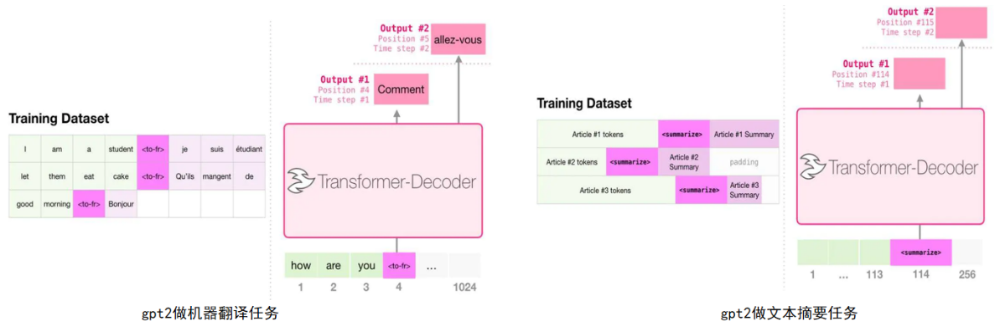  

**gpt2与gpt的不同点：**
- fine-tuning层：不再针对不同任务分别进行微调建模，而是不定义这个模型应该做什么任务，模型会自动识别出来需要做什么任务。学习的是一个通用NLP模型。
- 增加数据集：数据集包含800万个网页，大小为40G。gpt2需要的是带有任务信息的数据。
- 增加网络参数：gpt-2将Transformer堆叠的层数增加到48层，隐层的维度为1600，参数量更是达到了15亿(Bert large是3.4亿)。「小号」12 层，「中号」24 层，「大号」36 层，「特大号」48 层。

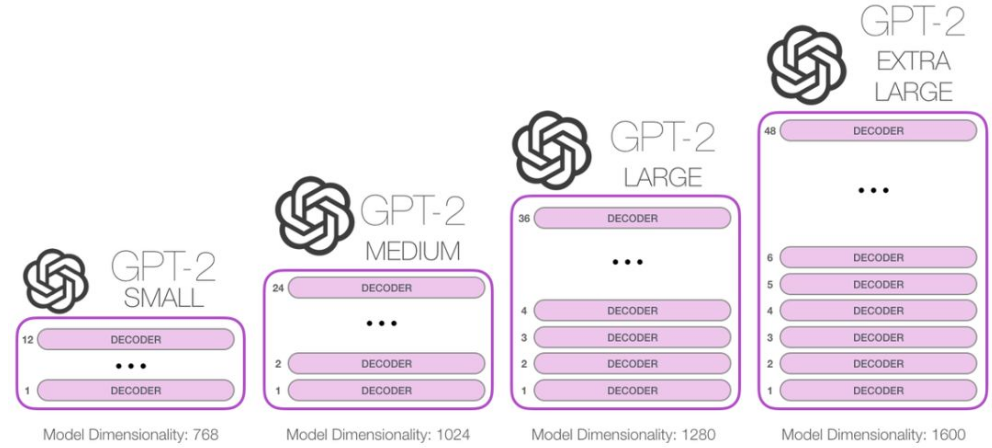

- 调整transformer：将layernorm放到每个sub-block之前；在最终自注意块之后添加了额外的层标准化；残差层的参数初始化根据网络深度进行调节。

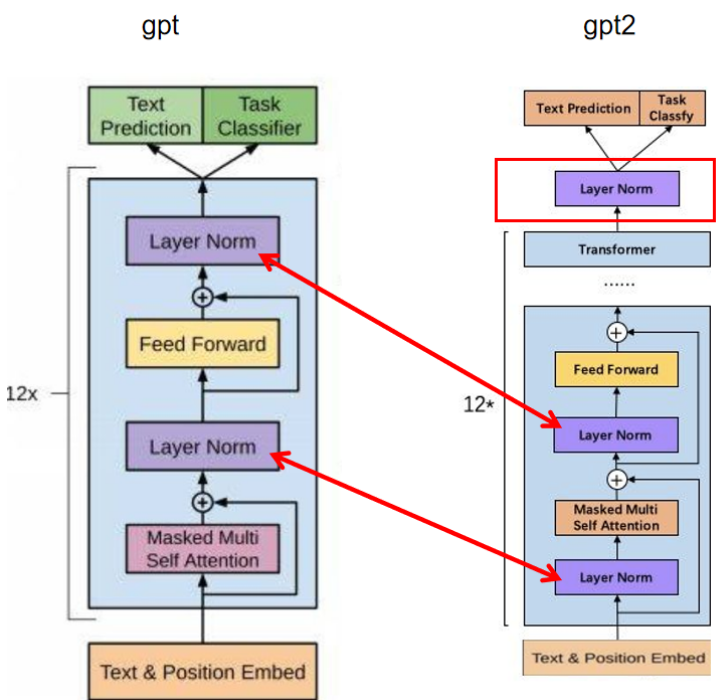

- 其他：gpt-2将词汇表增加到5万(Bert英文是3万，中文是2万)；embedding size包括768，1024，1280，1600；可处理单词序列长度从gpt的512提升到1024；batchsize增加到512。

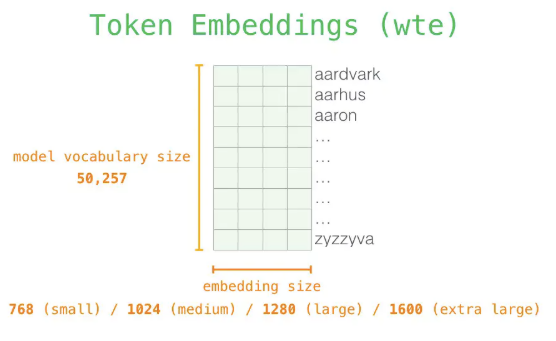

#### 6.5.3 百度ERNIE
**ERNIE（Enhanced Representation through kNowledge IntEgration）：**

- 受到Bert掩盖策略的启发，Yu Sun等人提出了一种新的语言表示模型ERNIE（Enhanced Representation through kNowledge IntEgration）：
- ERNIE旨在学习通过知识掩盖策略增强模型性能，其中包括实体级掩盖和短语级掩盖，两者对比如图所示。实体级策略可掩盖通常由多个单词组成的实体。短语级策略掩盖了由几个单词组合成一个概念单元组成的整个短语。实验结果表明，ERNIE优于其他基准方法，在五种中文自然语言处理上获得了最新的最新结果任务包括自然语言推理，语义相似性，命名实体识别，情感分析和问题解答。

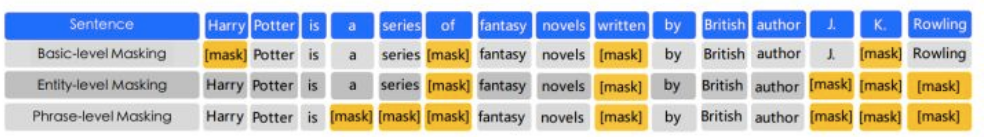  
实体级掩盖和短语级掩盖

- 他们还证明ERNIE在完形填空测试中具有更强大的知识推理能力。知识掩盖策略如图所示。

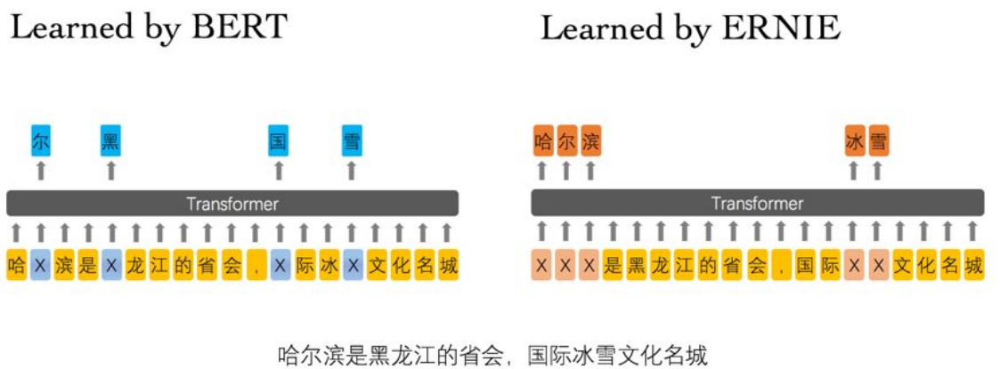
> 在 Bert 模型中，通过『哈』与『滨』的局部共现，即可判断出『尔』字，模型没有学习与『哈尔滨』相关的知识。而 ERNIE 通过学习词与实体的表达，使模型能够建模出『哈尔滨』与『黑龙江』的关系，学到『哈尔滨』是『黑龙江』的省会以及『哈尔滨』是个冰雪城市。

#### 6.5.4 XLNet
**AR与AE语言模型：**

- AR语言模型(AutoRegressive LM)：只能获取单向信息，即只能前向读取信息并预测t位置的单词或者从后向读取信息并预测t位置的单词，却不能同时获取双向信息，代表例子是gpt，gpt2，XLNet，elmo
- AE语言模型(AutoEncoder LM):获取双向信息进行预测，如想要预测位置t的单词，既可以前向获取信息也可以后向获取信息，代表例子是Bert

**AR语言模型(AutoRegressive LM)：**

- AR LM的优点：比较擅长生成类任务
- 缺点：只能获取单向信息，不能获取双向信息。

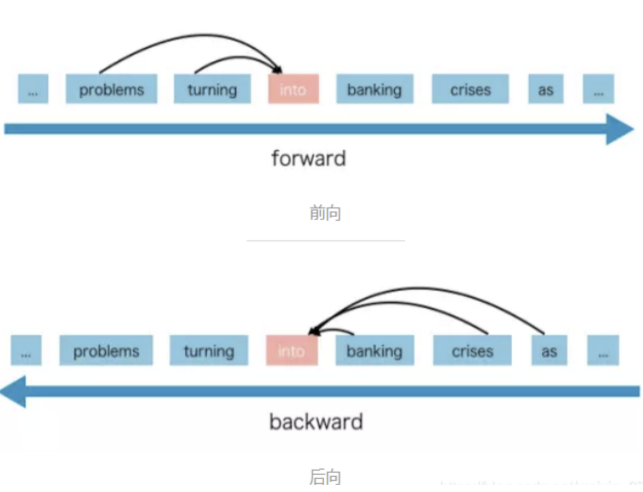

**AE语言模型(AutoEncoder LM)：**

- AE LM的优点：可以获取双向信息，能同时看到预测位置的上文和下文
- 缺点：如Bert，它在预训练过程中会增加输入噪声，如对输入序列会随机mask掉一部分的单词，而在微调时却不会增加输入噪声，这种预训练-微调步骤中产生的差异，会产生一部分的人为误差

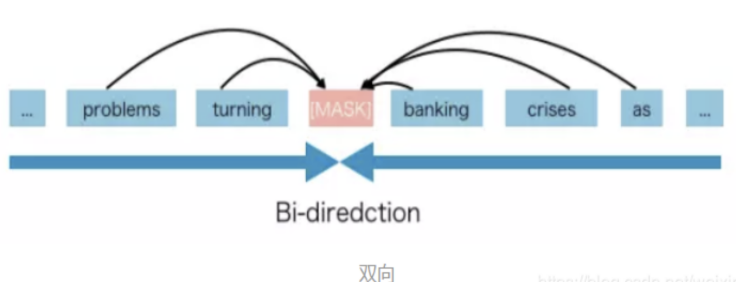

**重排列语言模型(Permutation Language Model)：**

- 既能AR又能AE
- 这里我们用一个例子来解释。序列顺序是[x1, x2, x3, x4]。该序列的所有排列如下。

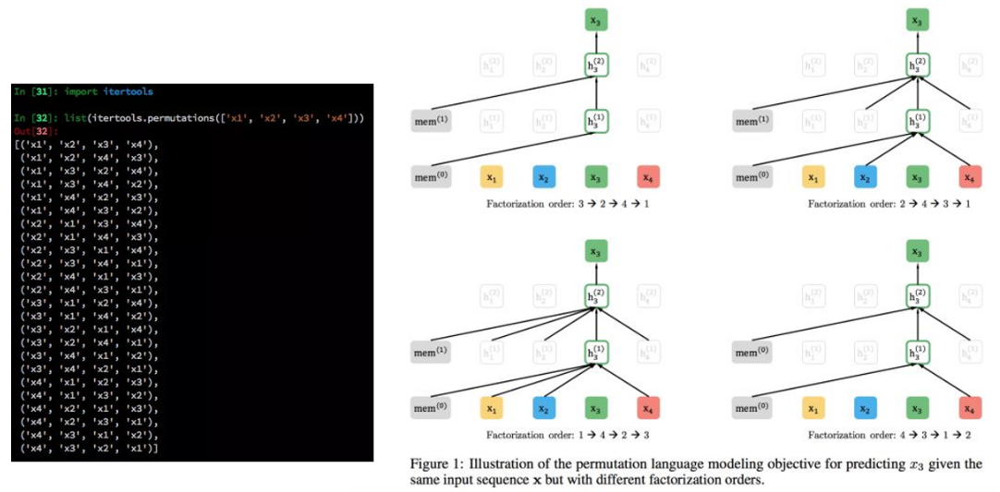

- 对于这4个tokens (N)的句子，有24个(N!)个排列。假设我们想要预测x3。24个排列中有4种模式，x3在第1位，第2位，第3位，第4位。

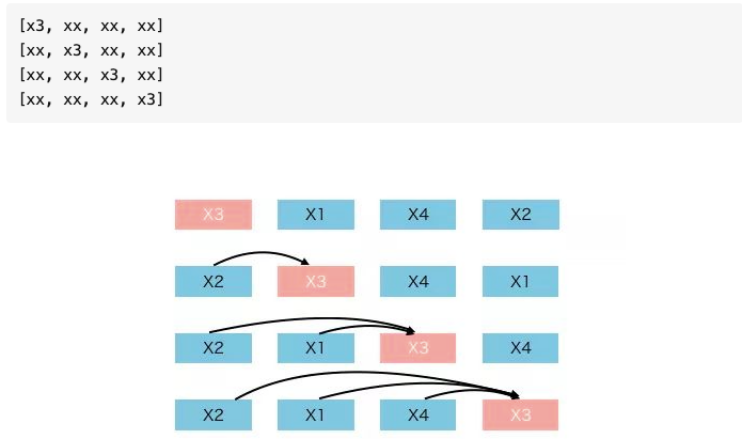
> - 在这里，我们将$x_3$位置设为第t位，它前面的t-1个tokens用来预测$x_3$。
> - $x_3$之前的单词包含序列中所有可能的单词和长度。直观地，模型将学习从两边的所有位置收集信息,又能像AR语言模型一样实现生成式任务。

**双流自注意力机制：**

该机制需要解决了两个问题

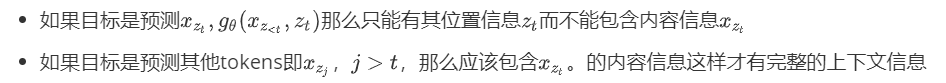

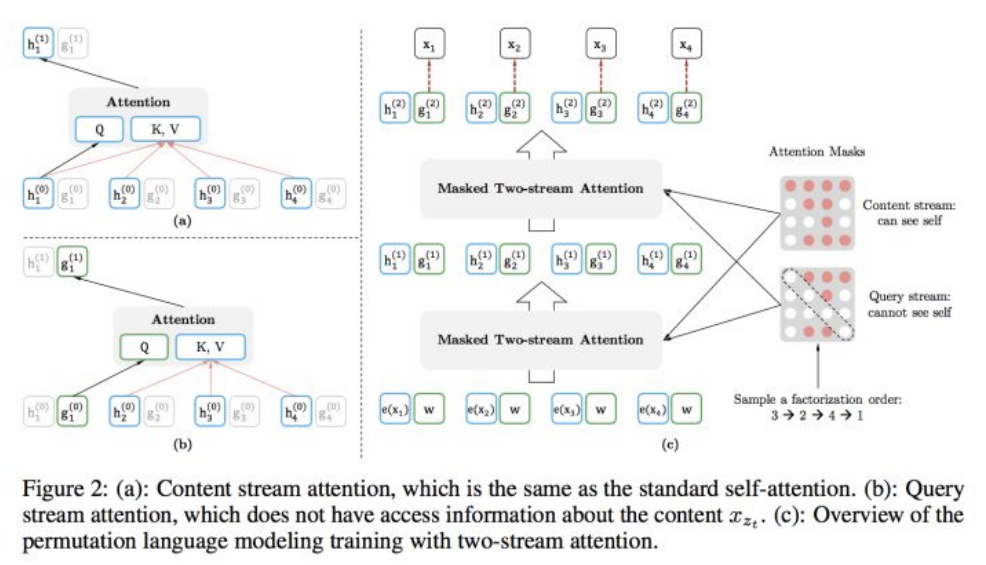

> - 输入序列保持：1→2→3→4
> - 采样序列：3→2→4→1
> - 第一行：对于1，可以看见234
> - 第二行：对于2，可以看见3
> - 第三行：对于3，谁都看不见
> - 第四行：对于4，可以看见23

**content stream：**

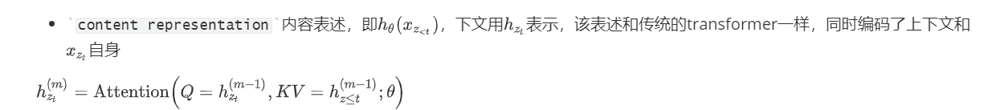

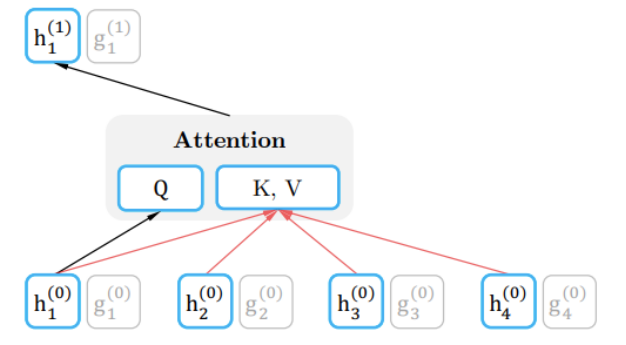

**query stream：**

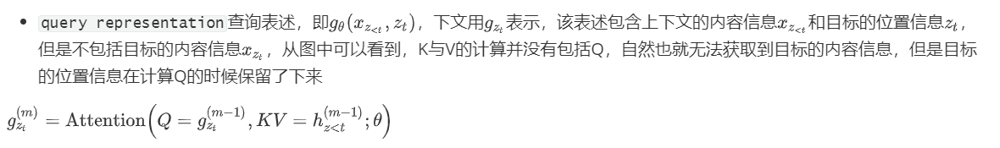

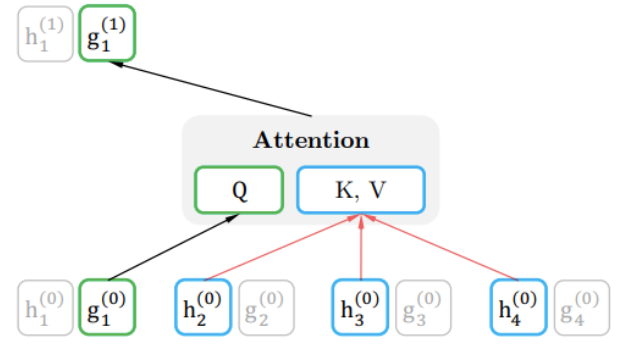

**Fine-tuning阶段：**

- 第一层的查询流 (Query Stream) 是随机初始化了一个向量，即 $g_i^{(0)} = w$；内容流 (Content Stream) 是采用的词向量，即 $h_i^{(0)} = e(x_i)$。
- 在 self-attention 的计算过程中，这两个流的网络权重是共享的。最后在微调 (Fine-tuning) 阶段，只需要简单地把 query stream 移除，只采用 content stream 即可。

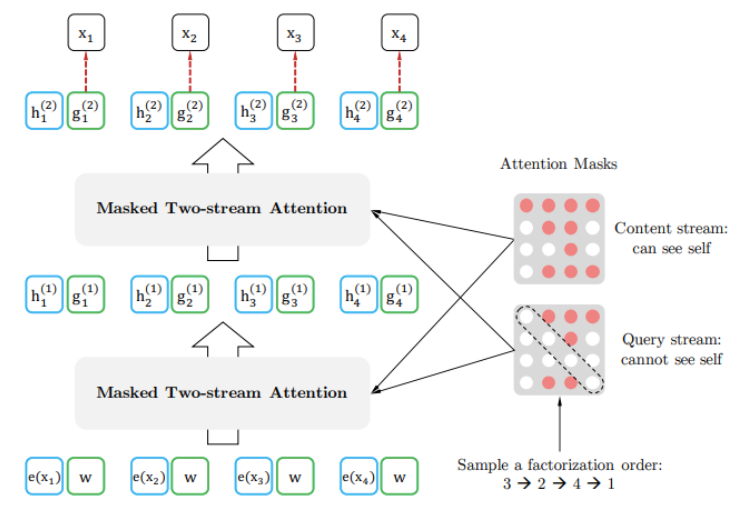

**片段循环机制**

- transformer-xl的提出主要是为了解决超长序列的依赖问题，对于普通的transformer由于有一个最长序列的超参数控制其长度，对于特别长的序列就会导致丢失一些信息，transformer-xl就能解决这个问题。我们看个例子，假设我们有一个长度为 1000的序列，如果我们设置transformer的最大序列长度是100，那么这个1000长度的序列需要计算十次，并且每一次的计算都没法考虑到每一个段之间的关系，如果采用transformer-xl，首先取第一个段进行计算，然后把得到的结果的隐藏层的值进行缓存，第二个段计算的过程中，把缓存的值拼接起来再进行计算。该机制不但能保留长依赖关系还能加快训练，因为每一个前置片段都保留了下来，不需要再重新计算，在transformer-x的论文中，经过试验其速度比transformer快了 1800倍。

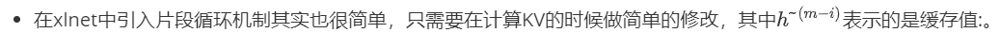
$$h_{z_t}^{(m)} = \operatorname{Attention}\left(Q=h_{z_t}^{(m-1)}, KV=\left[\tilde{h}^{(m-1)}, h_{z_{\le t}}^{(m-1)}\right]; \theta\right)$$

**相对位置编码**

BERT 的 position embedding 采用的是绝对位置编码，但是绝对位置编码在 Transformer-XL（以及 XLNet）中有一个致命的问题：在处理长文本时，它没法区分当前的 token 到底是属于哪一个文本片段（segment）里的，这就导致了一些位置和结构信息的损失。因此，这里被替换为了 Transformer-XL 中的相对位置编码。

假设给定一对位置 $i$ 与 $j$：
- 如果 $i$ 和 $j$ 是在同一个片段里的，那么我们令这个片段编码 $s_{ij} = s^+$
- 如果 $i$ 和 $j$ 不在同一个片段里，则令这个片段编码为 $s_{ij} = s^-$
这个 $s^+$ 和 $s^-$ 的值是在训练的过程中学习得到的向量，也是用来计算 attention weight 时候用到的。

在传统的 Transformer 中，Attention Weight 的计算公式通常如下（其中 $d_k$ 为维度 scaling factor）：
$$\text{Attention Weight} = \operatorname{softmax}\left(\frac{Q \cdot K^T}{\sqrt{d_k}}\right)$$
在引入这种相对的片段位置编码后，首先要计算出一个额外的注意力偏置 $a_{ij}$：
$$a_{ij} = (q_i + b)^T s_{ij}$$
其中，$q_i$ 是第 $i$ 个位置的 Query 向量，$b$ 是一个需要训练得到的全局偏置量（bias）。最后，把计算得到的 $a_{ij}$ 与传统的 Transformer 计算出的 attention score 相加，再进行 softmax，从而得到最终包含片段结构信息的 attention weight。

#### 6.5.5 ALBert
**ALBert在Bert 的基础上提出了一些新颖的想法来解决这些问题:**

- 1、跨层参数共享
- 2、句子顺序预测 (SOP)
- 3、嵌入参数分解

##### 1.跨层参数共享：

- Bert-large模型有24层，而它的基础版本有12层。随着层数的增加，参数的数量呈指数增长。

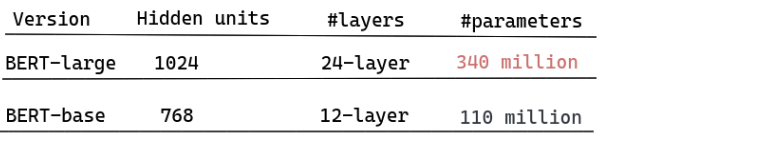

- 为了解决这个问题，ALBert使用了跨层参数共享的概念。为了说明这一点，让我们看一下12层的Bert-base模型的例子。我们只学习第一个块的参数，并在剩下的11个层中重用该块，而不是为12个层中每个层都学习不同的参数。

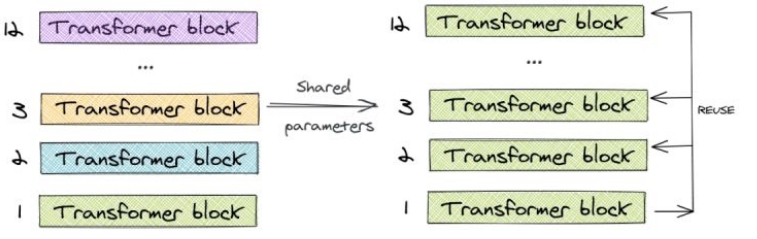

##### 2.句子顺序预测 (SOP)：

- Bert引入了一个叫做“下一个句子预测”的二分类损失。这是专门为提高使用句子对，如“自然语言推断”的下游任务的性能而创建的。基本流程为：从训练语料库中取出两个连续的段落作为正样本从不同的文档中随机创建一对段落作为负样本

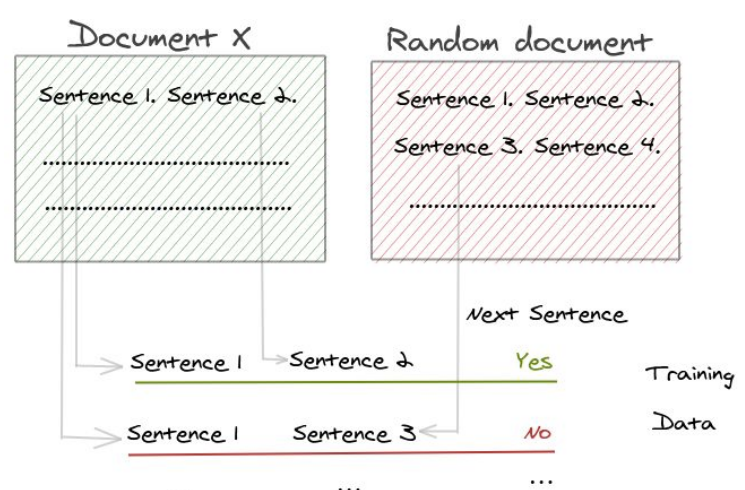
> 像ROBertA和XLNET这样的论文已经阐明了NSP的无效性，并且发现它对下游任务的影响是不可靠的。在取消NSP任务之后，多个任务的性能都得到了提高。

因此，ALBert提出了另一个任务“句子顺序预测”。关键思想是:

- 从同一个文档中取两个连续的段落作为一个正样本
- 交换这两个段落的顺序，并使用它作为一个负样本

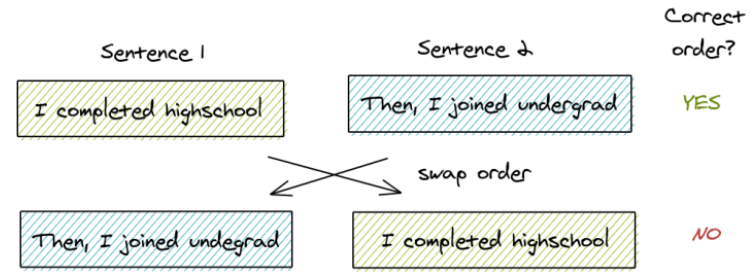

> 这使得模型能学习到更细粒度的关于段落级的一致性的区别。

##### 3.嵌入参数分解：

- 在Bert中，使用的embeddings(word piece embeddings)大小被链接到transformer块的隐藏层大小。Word piece embeddings使用了大小为30,000的词汇表的独热编码表示。这些被直接投射到隐藏层的隐藏空间。
- 假设我们有一个大小为30K的词汇表，大小为E=768的word-piece embedding和大小为H=768的隐含层。如果我们增加了块中的隐藏单元尺寸，那么我们还需要为每个嵌入添加一个新的维度。这个问题在XLNET和ROBertA中也很普遍。

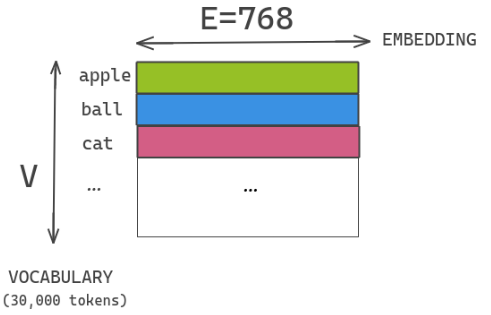

- ALBert通过将大的词汇表嵌入矩阵分解成两个小的矩阵来解决这个问题。这将隐藏层的大小与词汇表嵌入的大小分开。这允许我们在不显著增加词汇表嵌入的参数大小的情况下增加隐藏的大小。

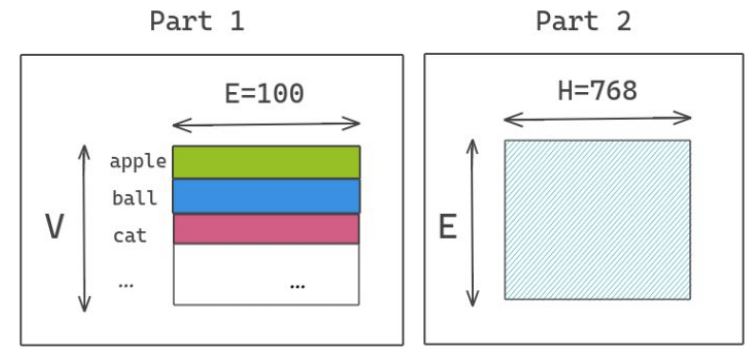

> 我们将独热编码向量投影到E=100的低维嵌入空间，然后将这个嵌入空间投影到隐含层空间H=768。